<a href="https://colab.research.google.com/github/virtue-greaze/virtue-obiakwa/blob/main/Heart_Disease_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Heart Disease Dataset**

# Heart Attack Analysis using Python
Exploring the key factors that influence heart disease risk.

Steps

In [8]:
#Import Libraries
!pip install plotly
from IPython.display import display, HTML

display(HTML("<style>.container { width:100% !important; }</style>"))

import pandas as pd

import plotly.graph_objs as go

Load Data

In [5]:
# Load dataset
df = pd.read_csv("/content/heart_attack_south_africa (10).csv")

Data Check and Cleaning

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 20 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Patient_ID                    100000 non-null  int64  
 1   Age                           100000 non-null  int64  
 2   Gender                        100000 non-null  object 
 3   Cholesterol_Level             100000 non-null  int64  
 4   Blood_Pressure_Systolic       100000 non-null  int64  
 5   Blood_Pressure_Diastolic      100000 non-null  int64  
 6   Smoking_Status                100000 non-null  object 
 7   Alcohol_Intake                100000 non-null  object 
 8   Physical_Activity             100000 non-null  object 
 9   Obesity_Index                 100000 non-null  float64
 10  Diabetes_Status               100000 non-null  object 
 11  Family_History_Heart_Disease  100000 non-null  object 
 12  Diet_Quality                  100000 non-null

In [7]:
df.head()

,Patient_ID,Age,Gender,Cholesterol_Level,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Smoking_Status,Alcohol_Intake,Physical_Activity,Obesity_Index,Diabetes_Status,Family_History_Heart_Disease,Diet_Quality,Stress_Level,Heart_Attack_History,Medication_Usage,Triglycerides_Level,LDL_Level,HDL_Level,Heart_Attack_Outcome
0,1,76,Female,156,94,79,No,High,Sedentary,35.2,No,No,Good,High,No,No,264,141,65,0
1,2,39,Female,160,185,88,No,Low,Sedentary,21.3,No,No,Average,Medium,No,Yes,150,81,42,0
2,3,85,Male,254,173,113,Yes,Moderate,Highly Active,32.0,Yes,No,Good,Low,No,No,220,124,70,1
3,4,45,Female,261,187,65,No,High,Sedentary,36.4,No,Yes,Average,Low,No,Yes,141,56,38,1
4,5,48,Male,206,189,84,No,Low,Active,26.6,No,No,Good,High,No,No,221,186,26,0


In [9]:
# Check for duplicate rows
# Counting the number of duplicate rows
num_duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


# **Interactive 3D Scatter Plot of Heart Attack Risk Factors**

In [10]:
# Create the 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=df['Age'],
    y=df['Cholesterol_Level'],
    z=df['Blood_Pressure_Systolic'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['Heart_Attack_Outcome'],  # binary outcome (e.g., 0 or 1)
        colorscale='Viridis',
        opacity=0.7
    ),
    text=[f"Gender: {g}, Smoking: {s}" for g, s in zip(df['Gender'], df['Smoking_Status'])]
))

fig.update_layout(
    title="3D Scatter Plot: Age vs. Cholesterol vs. Systolic BP",
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Cholesterol Level',
        zaxis_title='Systolic Blood Pressure'
    )
)

fig.show()

# **3D Surface Plot of Predicted Heart Attack Risk**

In [11]:
#Required Libraries
import numpy as np
from sklearn.linear_model import LogisticRegression
import plotly.graph_objs as go

In [12]:
# Prepare features and target variable
# Remove rows with NaN in 'Heart_Attack_Outcome'
df_cleaned = df.dropna(subset=['Heart_Attack_Outcome'])
X = df_cleaned[['Age', 'Cholesterol_Level']]
y = df_cleaned['Heart_Attack_Outcome']

# Train the logistic regression model
model = LogisticRegression().fit(X, y)

# Create a meshgrid for Age and Cholesterol_Level
age_range = np.linspace(df_cleaned['Age'].min(), df_cleaned['Age'].max(), 50)
chol_range = np.linspace(df_cleaned['Cholesterol_Level'].min(), df_cleaned['Cholesterol_Level'].max(), 50)
age_grid, chol_grid = np.meshgrid(age_range, chol_range)

# Predict risk probability over the grid
grid_points = np.c_[age_grid.ravel(), chol_grid.ravel()]
risk_prob = model.predict_proba(grid_points)[:, 1].reshape(age_grid.shape)

# Create the 3D surface plot
fig_surface = go.Figure(data=go.Surface(
    x=age_grid,
    y=chol_grid,
    z=risk_prob,
    colorscale='Blues'
))

fig_surface.update_layout(
    title="3D Surface Plot: Predicted Heart Attack Risk",
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Cholesterol Level',
        zaxis_title='Risk Probability'
    )
)

fig_surface.show()

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



# **Clustering Analysis with 3D Visualization**

In [13]:
# Required Libraries
import pandas as pd
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [14]:
# Select features for clustering
features = ['Age', 'Cholesterol_Level', 'Blood_Pressure_Systolic', 'Obesity_Index']
X = df[features].dropna()  # drop any missing values if necessary

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform k-means clustering (experiment with n_clusters, e.g., 3)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Create a new DataFrame with cluster labels
df_cluster = X.copy()
df_cluster['Cluster'] = clusters
df_cluster['Patient_ID'] = df['Patient_ID']

# Create the 3D scatter plot with clusters
fig_cluster = go.Figure(data=go.Scatter3d(
    x=df_cluster['Age'],
    y=df_cluster['Cholesterol_Level'],
    z=df_cluster['Blood_Pressure_Systolic'],
    mode='markers',
    marker=dict(
        size=5,
        color=df_cluster['Cluster'],
        colorscale='cividis',
        opacity=0.7
    ),
    text=[f"Patient ID: {pid}<br>Obesity Index: {oi}" for pid, oi in zip(df_cluster['Patient_ID'], df_cluster['Obesity_Index'])]
))

fig_cluster.update_layout(
    title="3D Clustering of Heart Attack Risk Factors",
    scene=dict(
        xaxis_title='Age',
        yaxis_title='Cholesterol Level',
        zaxis_title='Systolic Blood Pressure'
    )
)

fig_cluster.show()

# **Advanced Cholesterol Distribution Plot**

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

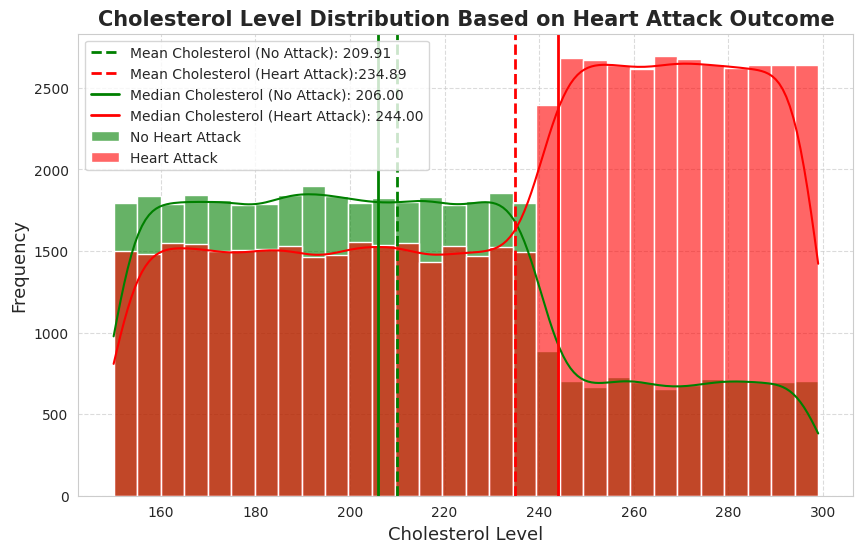

In [19]:
# Calculate mean and median cholesterol levels based on heart attack outcome
mean_chol_no_attack = df[df['Heart_Attack_Outcome'] == 0]['Cholesterol_Level'].mean()
mean_chol_attack = df[df['Heart_Attack_Outcome'] == 1]['Cholesterol_Level'].mean()

median_chol_no_attack = df[df['Heart_Attack_Outcome'] == 0]['Cholesterol_Level'].median()
median_chol_attack = df[df['Heart_Attack_Outcome'] == 1]['Cholesterol_Level'].median()

# Set Seaborn style (Seaborn)
sns.set_style("whitegrid") # This applies a polished white-grid background to the plot
# Create figure and axis (Matplotlib)
plt.figure(figsize=(10, 6)) # Set figure size using Matplotlib

# Seaborn histogram with KDE (Seaborn)
sns.histplot(df[df['Heart_Attack_Outcome'] == 0]['Cholesterol_Level'],
             kde=True, color='green',bins=30, alpha=0.6, label='No Heart Attack')

sns.histplot(df[df['Heart_Attack_Outcome'] == 1]['Cholesterol_Level'],
             kde=True, color='red', bins=30, alpha=0.6, label='Heart Attack')

# Add mean and median lines for each group (Matplotlib)
plt.axvline(mean_chol_no_attack, color='green', linestyle='--', linewidth=2,
            label=f"Mean Cholesterol (No Attack): {mean_chol_no_attack:.2f}") # Mean line for No Heart Attack
plt.axvline(mean_chol_attack, color='red', linestyle='--', linewidth=2,
            label=f"Mean Cholesterol (Heart Attack):{mean_chol_attack:.2f}") # Mean line for HeartAttack

plt.axvline(median_chol_no_attack, color='green', linestyle='-', linewidth=2,
            label=f"Median Cholesterol (No Attack): {median_chol_no_attack:.2f}") # Median line for No Heart Attack
plt.axvline(median_chol_attack, color='red', linestyle='-', linewidth=2,
            label=f"Median Cholesterol (Heart Attack): {median_chol_attack:.2f}") # Median line for Heart Attack

# Matplotlib Customization (Matplotlib)
plt.title("Cholesterol Level Distribution Based on Heart Attack Outcome",
          fontsize=15, fontweight="bold") # Set title
plt.xlabel("Cholesterol Level", fontsize=13) # X-axis label
plt.ylabel("Frequency", fontsize=13) # Y-axis label
plt.legend() # Display the legend for mean and median lines
plt.grid(True, linestyle="--", alpha=0.7) # Add grid with dashed lines and transparency

# Show the plot (Matplotlib)
plt.show() # Display the plot

# **Overlaying Line and Scatter Plots**

/tmp/ipython-input-1536033643.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




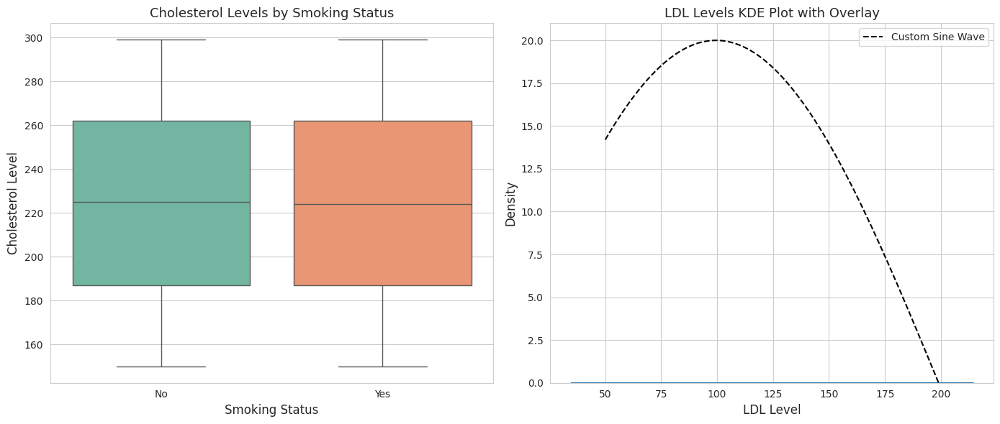

In [20]:
# Create subplots with two axes (Matplotlib)
fig, ax = plt.subplots(1, 2, figsize=(14, 6)) # 1 row, 2 columns of plots

# ========= Seaborn Boxplot (First Plot) ========
# Boxplot for Cholesterol Level across Smoking Status (Seaborn)
sns.boxplot(data=df, x="Smoking_Status",
            y="Cholesterol_Level", ax=ax[0], palette="Set2")

# Matplotlib customization (First Axis)
ax[0].set_title("Cholesterol Levels by Smoking Status",
                fontsize=13)
ax[0].set_xlabel("Smoking Status", fontsize=12)
ax[0].set_ylabel("Cholesterol Level", fontsize=12)

# Seaborn KDE Plot with Matplotlib Line (Second Plot)
# Kernel Density Estimation (KDE) Plot for LDL Level based on Heart Attack Outcome (Seaborn)
sns.kdeplot(data=df, x="LDL_Level",
            hue="Heart_Attack_Outcome", fill=True, alpha=0.4, ax=ax[1])

# Overlay Matplotlib sine wave for illustration (Matplotlib)
x = np.linspace(df["LDL_Level"].min(),
df["LDL_Level"].max(), 100)
y = np.sin(x / max(x) * np.pi) * 20 # Normalizing x and scaling sine wave
ax[1].plot(x, y, color="black", linestyle="--", label="Custom Sine Wave")

# Matplotlib customization (Second Axis)
ax[1].set_title("LDL Levels KDE Plot with Overlay",
                fontsize=13)
ax[1].set_xlabel("LDL Level", fontsize=12)
ax[1].set_ylabel("Density", fontsize=12)
ax[1].legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

# **Heatmap For Correlation**

In [22]:
# 📊 Interactive Correlation Heatmap using Plotly
import plotly.express as px

# Compute correlation matrix
corr_matrix = df.corr(numeric_only=True)

# Convert to long-form DataFrame for Plotly
corr_long = corr_matrix.reset_index().melt(id_vars='index')
corr_long.columns = ['Feature1', 'Feature2', 'Correlation']

# Plot interactive heatmap
fig = px.imshow(
    corr_matrix,
    text_auto=True,
    color_continuous_scale='RdBu_r',
    title="Interactive Correlation Heatmap of Heart Disease Factors"
)

fig.update_layout(
    xaxis_title="Heart Disease Factors",
    yaxis_title="Heart Disease Factors",
    width=800,
    height=700
)

fig.show()

# **Insights**


Individuals over 50 years old with high cholesterol and elevated blood pressure cluster in the heart attack positive (1) region.

Younger individuals generally have lower cholesterol and blood pressure, corresponding to non-heart attack cases (0).

The separation of points suggests a nonlinear interaction — meaning risk increases sharply when both cholesterol and blood pressure are high, especially with age
The logistic model indicates age and cholesterol are strong joint predictors of heart attack risk.

Risk is minimal under 40 years but grows exponentially with cholesterol above 220 mg/dL and systolic BP over 140 mmHg.

There’s a clear “risk plateau” at older ages — once patients are over 60, nearly all high-cholesterol individuals fall in the high-risk zone.

# **Conclusion**

The analysis shows that age, cholesterol, and blood pressure are the strongest predictors of heart attack risk, with smoking and gender further increasing vulnerability. Using Seaborn and Plotly, both static and interactive visuals revealed clear patterns that highlight how data analysis can support better health risk understanding and decision-making.